# Лабораторна робота 3


### Підготовка датасету

In [2]:
n_classes = 24
imgs_path = './dataset/semantic_drone_dataset/original_images/'
masks_path = './dataset/semantic_drone_dataset/label_images_semantic/'
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(DEVICE)


def create_df():
    name = []
    for dirname, _, filenames in os.walk(imgs_path):
        for filename in filenames:
            name.append(filename.split('.')[0])

    return pd.DataFrame({'id': name}, index = np.arange(0, len(name)))

df = create_df()
print('Total Images: ', len(df))

cpu
Total Images:  400


In [3]:
#split data
X_train, X_val = train_test_split(df['id'].values, test_size=0.15, shuffle=False)

print('Train Size   : ', len(X_train))
print('Val Size     : ', len(X_val))
print('Train Last   : ', X_train[-1])
print('Val Last     : ', X_val[-2])

Train Size   :  340
Val Size     :  60
Train Last   :  509
Val Last     :  596


In [4]:
class DroneDataset(Dataset):

    def __init__(self, img_path, mask_path, X, mean, std, transform=None, patch=False):
        self.img_path = img_path
        self.mask_path = mask_path
        self.X = X
        self.transform = transform
        self.patches = patch
        self.mean = mean
        self.std = std

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        img = cv2.imread(self.img_path + self.X[idx] + '.jpg')
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(self.mask_path + self.X[idx] + '.png', cv2.IMREAD_GRAYSCALE)

        if self.transform is not None:
            aug = self.transform(image=img, mask=mask)
            img = Image.fromarray(aug['image'])
            mask = aug['mask']

        if self.transform is None:
            img = Image.fromarray(img)

        t = T.Compose([T.ToTensor(), T.Normalize(self.mean, self.std)])
        img = t(img)
        mask = torch.from_numpy(mask).long()

        if self.patches:
            img, mask = self.tiles(img, mask)

        return img, mask

    def tiles(self, img, mask):
        img_patches = img.unfold(1, 512, 512).unfold(2, 768, 768)
        img_patches  = img_patches.contiguous().view(3,-1, 512, 768)
        img_patches = img_patches.permute(1,0,2,3)

        mask_patches = mask.unfold(0, 512, 512).unfold(1, 768, 768)
        mask_patches = mask_patches.contiguous().view(-1, 512, 768)

        return img_patches, mask_patches

In [5]:
mean=[0.485, 0.456, 0.406]
std=[0.229, 0.224, 0.225]

# t_train = A.Compose([A.Resize(704, 1056, interpolation=cv2.INTER_NEAREST), A.HorizontalFlip(), A.VerticalFlip(),
#                      A.GridDistortion(p=0.2), A.RandomBrightnessContrast((0,0.5),(0,0.5)),
#                      A.GaussNoise()])

# t_val = A.Compose([A.Resize(704, 1056, interpolation=cv2.INTER_NEAREST), A.HorizontalFlip(),
#                    A.GridDistortion(p=0.2)])


t_train = A.Compose([A.Resize(256, 256, interpolation=cv2.INTER_NEAREST)])

t_val = A.Compose([A.Resize(256, 256, interpolation=cv2.INTER_NEAREST)])

#datasets
train_set = DroneDataset(imgs_path, masks_path, X_train, mean, std, t_train, patch=False)
val_set = DroneDataset(imgs_path, masks_path, X_val, mean, std, t_val, patch=False)

#dataloader
batch_size = 8

train_loader = DataLoader(train_set, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_set, batch_size=batch_size, shuffle=True)

### Обрані метрики (для оцінки продуктивності моделі)

* Mean Intersection Over Union (mIoU) as main metric; standard to measure overall performance, while treating all classes equally

Measures the overlap between the predicted segmentation and the ground truth, normalized by their union.

mIoU = mean ((TP+FP+FN) / TP) over all classes and batch

In [7]:
def mIoU(pred_mask, mask, smooth=1e-10, n_classes=24):
    with torch.no_grad():
        pred_mask = F.softmax(pred_mask, dim=1)
        pred_mask = torch.argmax(pred_mask, dim=1)
        pred_mask = pred_mask.contiguous().view(-1)
        mask = mask.contiguous().view(-1)

        iou_per_class = []
        for clas in range(0, n_classes):
            true_class = pred_mask == clas
            true_label = mask == clas

            if true_label.long().sum().item() == 0:
                iou_per_class.append(np.nan)
            else:
                intersect = torch.logical_and(true_class, true_label).sum().float().item()
                union = torch.logical_or(true_class, true_label).sum().float().item()

                iou = (intersect + smooth) / (union + smooth)
                iou_per_class.append(iou)
        return np.nanmean(iou_per_class)

* Pixel Accuracy (PA); simple, easy to understand, intuitive

Ratio of correctly predicted pixels to the total number of pixels.

PA = Total Correct Pixels / Total Number of Pixels

In [8]:
def pixel_accuracy(output, mask):
    with torch.no_grad():
        output = torch.argmax(F.softmax(output, dim=1), dim=1)
        correct = torch.eq(output, mask).int()
        accuracy = float(correct.sum()) / float(correct.numel())
    return accuracy

* Mean Dice Coefficient (F1-Score for Segmentation); to handle small imbalanced dataset

Measures the harmonic mean of precision and recall, focusing on pixel-wise overlap.

mDice = mean ((2TP+FP+FN) / 2TP) over all classes and batch
​


In [9]:
def dice_coefficient(output, mask, smooth=1e-6):
    probs = F.softmax(output, dim=1)
    
    num_classes = output.size(1)
    masks_one_hot = F.one_hot(mask, num_classes=num_classes).permute(0, 3, 1, 2)
    
    probs_flat = probs.view(probs.size(0), probs.size(1), -1)
    masks_flat = masks_one_hot.view(masks_one_hot.size(0), masks_one_hot.size(1), -1)
    
    intersection = (probs_flat * masks_flat).sum(dim=2)
    union = probs_flat.sum(dim=2) + masks_flat.sum(dim=2)
    
    dice = (2.0 * intersection + smooth) / (union + smooth)
    
    return dice.mean().item()

### Обрані функції втрат (для оцінки втрат моделі під час навчання)

* Categorical Cross-Entropy Loss - the most popular for semantic segmentation, simple and effective for multi-class segmentation, though sensitive to imbalanced classes

CE = mean (-y * log(p)) over all classes and batch

In [10]:
criterion = nn.CrossEntropyLoss()

* Combination of Mean Categorical Cross-Entropy Loss + Mean Dice Loss

Balances pixel-wise accuracy and region overlap.

where Dice Loss = 1 - (2⋅∣P∩G∣) / (∣P∣+∣G∣) measures the overlap between predicted and ground truth masks. Focuses on region-level (counter to pixel-wise) accuracy, making it robust for imbalanced datasets.

In [11]:
class CrossEntropyDiceLoss(nn.Module):
    def __init__(self, weight=None, smooth=1e-8):
        super(CrossEntropyDiceLoss, self).__init__()
        self.weight = weight
        self.smooth = smooth
        self.cross_entropy = nn.CrossEntropyLoss(weight=weight)
    
    def forward(self, logits, targets):
        # Compute Cross-Entropy Loss
        ce_loss = self.cross_entropy(logits, targets)

        # Compute Dice Loss
        probs = F.softmax(logits, dim=1)
        targets_one_hot = F.one_hot(targets, num_classes=logits.shape[1]).permute(0, 3, 1, 2)

        intersection = torch.sum(probs * targets_one_hot, dim=(0, 2, 3))
        union = torch.sum(probs + targets_one_hot, dim=(0, 2, 3))
        dice_loss = 1 - (2.0 * intersection + self.smooth) / (union + self.smooth)

        # Mean Dice Loss over all classes
        dice_loss = dice_loss.mean()

        # Combine losses
        combined_loss = ce_loss + dice_loss
        return combined_loss

criterion = CrossEntropyDiceLoss()

* Focal Loss

Focal Loss = mean ((α * (1−p)^γ) * (-y * log(p))) over all classes and batch

A variant of cross-entropy designed for class imbalance. Reduces the impact of easy-to-classify examples, but needs tuning of α and γ.

In [12]:
class FocalLoss(nn.Module):
    def __init__(self, alpha=0.25, gamma=2.0, reduction='mean', smooth=1e-8):
        """
        Args:
            alpha (float): Weighting factor for class imbalance.
            gamma (float): Focusing parameter to down-weight easy examples.
            reduction (str): Specifies the reduction to apply to the output ('mean', 'sum', 'none').
        """
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction
        self.smooth = smooth

    def forward(self, logits, targets):
        probs = F.softmax(logits, dim=1)
        
        targets_one_hot = F.one_hot(targets, num_classes=logits.shape[1]).permute(0, 3, 1, 2)

        # Compute the focal weight
        focal_weight = self.alpha * ((1 - probs) ** self.gamma)  # Focusing on harder-to-classify examples

        # Compute Cross-Entropy
        ce_loss = -targets_one_hot * torch.log(probs + self.smooth)

        # Compute the Focal Loss
        loss = focal_weight * ce_loss

        # Reduce loss as specified
        if self.reduction == 'mean':
            return loss.mean()
        elif self.reduction == 'sum':
            return loss.sum()
        else:
            return loss


focal_loss = FocalLoss()


* Focal + Dice Loss

Handles class imbalance while improving segmentation accuracy.

### Моделі

#### Запрограмувати архітектуру нейронної мережі типу FCN (Fully Convolutional Network). Paper: https://arxiv.org/pdf/1411.4038

* No Fully Connected Layers: FCNs replace the fully connected layers in traditional CNNs with convolutional layers. This ensures that the network can output feature maps instead of class probabilities
* Pixel-level Prediction: FCNs are used for segmentation tasks, where the network classifies each pixel of an image individually (e.g., in semantic segmentation, where each pixel is assigned a class label)
* Input and Output Size: FCNs can handle variable input sizes and output maps of the same size as the input (e.g., a 256x256 input image might have a 256x256 output feature map)
* Upsampling Layers: FCNs use upsampling (e.g., using transposed convolutions or bilinear interpolation) to produce output maps that match the original input size, especially in tasks like segmentation where the output should have the same resolution as the input

За результатами статті "Fully Convolutional Networks for Semantic Segmentation" by Long, Shelhamer, and Darrell із завдання найкраще у співвідношенні кількості використаних ресурсів/результату показала себе FCN8.

Skip Connections: output=upsample(conv7+pool4+pool3). Combines feature maps from both the pool4 layer (output stride 16) and the pool3 layer (output stride 8) with the upsampled predictions from deeper layers (like pool5).

Upsampling:
Uses a stride of 8 to upsample the feature maps to the original image size.

Trade-Off:
Resolution: Produces higher-resolution predictions due to finer feature maps (pool3) being used in skip connections.

More accurate than FCN16 because it includes higher spatial detail from shallower layers. Slightly slower and more computationally expensive than FCN16 due to additional upsampling steps and operations.

##### Різні варіанти + tuning гіперпараметрів

In [116]:
class CustomizableFCN(nn.Module):
    def __init__(self,
                 num_classes=2,
                 num_conv_layers=4,
                 num_conv_filters=[64, 128, 256, 512],
                 num_upsample_layers=4,
                 num_upsample_filters=[512, 256, 128, 64],
                 kernel_sizes=[3],
                 dropout_rate=0.5,
                 pooling_type='max',
                 activation_function='relu',
                 input_channels=3,
                 dilation_rate=2):
        super(CustomizableFCN, self).__init__()

        self.num_classes = num_classes
        self.num_conv_layers = num_conv_layers
        self.num_conv_filters = num_conv_filters
        self.num_upsample_layers = num_upsample_layers
        self.num_upsample_filters = num_upsample_filters
        self.kernel_sizes = kernel_sizes
        self.dropout_rate = dropout_rate
        self.pooling_type = pooling_type
        self.activation_function = activation_function
        self.input_channels = input_channels
        self.dilation_rate = dilation_rate

        self.convs = nn.ModuleList()
        in_channels = self.input_channels

        for i in range(self.num_conv_layers):
            out_channels = self.num_conv_filters[i] if i < len(self.num_conv_filters) else self.num_conv_filters[-1]
            self.convs.append(nn.Conv2d(in_channels, out_channels, kernel_size=self.kernel_sizes[i], padding=((self.kernel_sizes[i] - 1) // 2)))
            in_channels = out_channels

        self.dropout = nn.Dropout2d(p=self.dropout_rate)

        if self.pooling_type == 'max':
              self.pooling = nn.MaxPool2d(kernel_size=2, stride=2)
        elif self.pooling_type == 'average':
              self.pooling = nn.AvgPool2d(kernel_size=2, stride=2)
        else:
              raise ValueError("Invalid pooling type. Choose 'max' or 'average'.")

        self.dilated_conv = nn.Conv2d(in_channels, in_channels, kernel_size=self.kernel_sizes[-1], dilation=self.dilation_rate, padding=self.dilation_rate)

        self.upsample_layers = nn.ModuleList()
        for i in range(self.num_upsample_layers):
            out_channels = self.num_upsample_filters[i] if i < len(self.num_upsample_filters) else self.num_upsample_filters[-1]
            self.upsample_layers.append(
                nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)
            )
            in_channels = out_channels


        self.final_conv = nn.Conv2d(in_channels, self.num_classes, kernel_size=self.kernel_sizes[-1], padding=((self.kernel_sizes[-1] - 1) // 2))

        self._activation = self._get_activation_function()

    def _get_activation_function(self):
        if self.activation_function == 'relu':
            return F.relu
        elif self.activation_function == 'leaky_relu':
            return F.leaky_relu
        elif self.activation_function == 'sigmoid':
            return torch.sigmoid
        elif self.activation_function == 'tanh':
            return torch.tanh
        else:
            raise ValueError(f"Unsupported activation function: {self.activation_function}")

    def forward(self, x):
      for conv in self.convs:
        x = conv(x)
        x = self._activation(x)
        x = self.pooling(x)


      x = self.dropout(x)
      x = self.dilated_conv(x)

      x = self._activation(x)

      for upsample in self.upsample_layers:
          x = upsample(x)

      x = self.final_conv(x)

      return x

def create_custom_fcn_model(num_classes=2,
                            num_conv_layers=4,
                            num_conv_filters=[64, 128, 256, 512],
                            num_upsample_layers=4,
                            num_upsample_filters=[512, 256, 128, 64],
                            kernel_sizes=[3],
                            dropout_rate=0.5,
                            pooling_type='max',
                            activation_function='relu',
                            input_channels=3,
                            dilation_rate=2):
    model = CustomizableFCN(
        num_classes=num_classes,
        num_conv_layers=num_conv_layers,
        num_conv_filters=num_conv_filters,
        num_upsample_layers=num_upsample_layers,
        num_upsample_filters=num_upsample_filters,
        kernel_sizes=kernel_sizes,
        dropout_rate=dropout_rate,
        pooling_type=pooling_type,
        activation_function=activation_function,
        input_channels=input_channels,
        dilation_rate=dilation_rate
    )
    return model


In [117]:
model1 = create_custom_fcn_model(
    num_classes=24,
    num_conv_layers=2,
    num_conv_filters=[64, 128],
    num_upsample_layers=2,
    num_upsample_filters=[64, 32],
    kernel_sizes=[5, 3],
    dropout_rate=0.1,
    pooling_type='average',
    activation_function='relu',
    input_channels=3,
    dilation_rate=2
)
model1

CustomizableFCN(
  (convs): ModuleList(
    (0): Conv2d(3, 64, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  )
  (dropout): Dropout2d(p=0.1, inplace=False)
  (pooling): AvgPool2d(kernel_size=2, stride=2, padding=0)
  (dilated_conv): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(2, 2), dilation=(2, 2))
  (upsample_layers): ModuleList(
    (0): ConvTranspose2d(128, 64, kernel_size=(2, 2), stride=(2, 2))
    (1): ConvTranspose2d(64, 32, kernel_size=(2, 2), stride=(2, 2))
  )
  (final_conv): Conv2d(32, 24, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
)

In [130]:
model2 = create_custom_fcn_model(
    num_classes=24,
    num_conv_layers=3,
    num_conv_filters=[64, 128, 256],
    num_upsample_layers=3,
    num_upsample_filters=[128, 64, 32],
    kernel_sizes=[3, 3, 3],
    dropout_rate=0.1,
    pooling_type='max',
    activation_function='relu',
    input_channels=3,
    dilation_rate=2
)
model2

CustomizableFCN(
  (convs): ModuleList(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (2): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  )
  (dropout): Dropout2d(p=0.1, inplace=False)
  (pooling): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (dilated_conv): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(2, 2), dilation=(2, 2))
  (upsample_layers): ModuleList(
    (0): ConvTranspose2d(256, 128, kernel_size=(2, 2), stride=(2, 2))
    (1): ConvTranspose2d(128, 64, kernel_size=(2, 2), stride=(2, 2))
    (2): ConvTranspose2d(64, 32, kernel_size=(2, 2), stride=(2, 2))
  )
  (final_conv): Conv2d(32, 24, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
)

In [132]:
class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU6(inplace=True),
            nn.Conv2d(out_channels, out_channels, 3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU6(inplace=True)
            )

    def forward(self, x):
        return self.conv(x)

In [139]:
class FCN8(nn.Module):
    def __init__(self, num_classes=24):
        super(FCN8, self).__init__()
        
        self.conv1 = DoubleConv(3, 64)
        self.conv2 = DoubleConv(64, 128)
        self.conv3 = DoubleConv(128, 256)
        self.conv4 = DoubleConv(256, 512)
        self.conv5 = DoubleConv(512, 512)
        
        self.fc = nn.Sequential(
            nn.Conv2d(512, 1024, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Dropout(),
            nn.Conv2d(1024, 1024, kernel_size=1),
            nn.ReLU(inplace=True),
            nn.Dropout(),
            nn.Conv2d(1024, num_classes, kernel_size=1)
        )
        
        self.fc6 = nn.Conv2d(512, 4096, kernel_size=7)
        self.relu6 = nn.ReLU(inplace=True)
        self.drop6 = nn.Dropout2d()

        self.fc7 = nn.Conv2d(4096, 4096, kernel_size=1)
        self.relu7 = nn.ReLU(inplace=True)
        self.drop7 = nn.Dropout2d()

        self.score_pool3 = nn.Conv2d(256, num_classes, kernel_size=1)
        self.score_pool4 = nn.Conv2d(512, num_classes, kernel_size=1)
        self.score_fc7 = nn.Conv2d(4096, num_classes, kernel_size=1)

        self.upscore2 = nn.ConvTranspose2d(num_classes, num_classes, kernel_size=4, stride=2, padding=1)
        self.upscore_pool4 = nn.ConvTranspose2d(num_classes, num_classes, kernel_size=4, stride=2, padding=1)
        self.upscore8 = nn.ConvTranspose2d(num_classes, num_classes, kernel_size=16, stride=8, padding=4)

    def forward(self, x):
        h = self.conv1(x)
        h = self.conv2(h)
        pool3 = h
        h = self.conv3(h)
        h = self.conv4(h)
        pool4 = h
        h = self.conv5(h)
        pool5 = h

        x = self.fc(h)

        fc7 = self.drop7(self.relu7(self.fc7(self.drop6(self.relu6(self.fc6(pool5))))))
        score_fc7 = self.score_fc7(fc7)

        score_pool4 = self.score_pool4(pool4)
        upscore_pool4 = self.upscore2(score_fc7) + score_pool4

        score_pool3 = self.score_pool3(pool3)
        upscore8 = self.upscore_pool4(upscore_pool4) + score_pool3

        out = self.upscore8(upscore8)

        return out

model3 = FCN8(num_classes=24)
model3


FCN8(
  (conv1): DoubleConv(
    (conv): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU6(inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU6(inplace=True)
    )
  )
  (conv2): DoubleConv(
    (conv): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU6(inplace=True)
      (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU6(inplace=True)
    )
  )
  (conv3): DoubleConv(
    (conv

In [140]:
class FCN32(nn.Module):
    def __init__(self, num_classes):
        super(FCN32, self).__init__()

        self.conv1 = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )

        self.conv2 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )

        self.conv3 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )

        self.conv4 = nn.Sequential(
            nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )
        
        self.conv5 = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )

        self.fc = nn.Sequential(
            nn.Conv2d(512, 1024, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Dropout(),
            nn.Conv2d(1024, 1024, kernel_size=1),
            nn.ReLU(inplace=True),
            nn.Dropout(),
            nn.Conv2d(1024, num_classes, kernel_size=1)
        )

        self.upscore1 = nn.ConvTranspose2d(num_classes, num_classes, kernel_size=22, stride=16, padding=11)
        self.upscore2 = nn.ConvTranspose2d(num_classes, num_classes, kernel_size=2, stride=2)
        self.upscore3 = nn.ConvTranspose2d(num_classes, num_classes, kernel_size=2, stride=2)
        self.upscore4 = nn.ConvTranspose2d(num_classes, num_classes, kernel_size=2, stride=2)
        self.upscore3 = nn.ConvTranspose2d(num_classes, num_classes, kernel_size=64, stride=32, padding=16, bias=False)


    def forward(self, x):
        h = self.conv1(x)
        h = self.conv2(h)
        h = self.conv3(h)
        h = self.conv4(h)
        h = self.conv5(h)

        h = self.fc(h)

        h = self.upscore1(h)
        h = self.upscore2(h)
        h = self.upscore3(h)
        h = self.upscore4(h)

        h = h[:, :, :x.size(2), :x.size(3)]

        return h

model4 = FCN32(24)
model4

FCN32(
  (conv1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (conv2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (conv3): Sequential(
    (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): ReLU(inplace=True)
    (6): MaxPool2d(

##### Основна натренована FCN

In [ ]:
class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU6(inplace=True),
            nn.Conv2d(out_channels, out_channels, 3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU6(inplace=True)
            )

    def forward(self, x):
        return self.conv(x)

In [ ]:
class ASPP(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(ASPP, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=1)
        self.conv2 = nn.Conv2d(in_channels, out_channels, kernel_size=3, dilation=6, padding=6)
        self.conv3 = nn.Conv2d(in_channels, out_channels, kernel_size=3, dilation=12, padding=12)
        self.conv4 = nn.Conv2d(in_channels, out_channels, kernel_size=3, dilation=18, padding=18)
        self.global_avg_pool = nn.AdaptiveAvgPool2d(1) #global context - output_size=1x1
        self.conv_g = nn.Conv2d(in_channels, out_channels, kernel_size=1)
        self.final = nn.Conv2d(out_channels * 5, out_channels, kernel_size=1)

    def forward(self, x):
        x1 = self.conv1(x)
        x2 = self.conv2(x)
        x3 = self.conv3(x)
        x4 = self.conv4(x)
        x5 = self.global_avg_pool(x)
        x5 = self.conv_g(x5)
        x5 = nn.functional.interpolate(x5, size=x.shape[2:], mode='bilinear', align_corners=False)
        return self.final(torch.cat([x1, x2, x3, x4, x5], dim=1))

ASPP (Atrous Spatial Pyramid Pooling) is a module designed to capture multi-scale contextual information effectively in deep learning models, particularly for image segmentation tasks. It uses atrous (dilated) convolutions with different dilation rates to process feature maps at multiple scales simultaneously:

1x1 Convolution: For point-wise feature extraction without changing the spatial resolution.
3x3 Atrous Convolutions with Different Dilation Rates:
A set of parallel 3x3 convolutions with increasing dilation rates (e.g., 6, 12, 18).
Each captures features at different scales
Atrous convolution (also called dilated convolution) is a type of convolution that expands the receptive field without increasing the number of parameters or computation.
It introduces spaces (or "holes") between kernel elements, controlled by a dilation rate.
Larger dilation rates allow the network to capture context from a broader area in the image

Global Average Pooling:
Summarizes the entire feature map into global information.
The output is resized to match the input feature map's spatial dimensions.

Concatenation and Fusion:
Outputs of all branches are concatenated along the channel dimension.
A final 1x1 convolution is applied to fuse the multi-scale features

Benefits of ASPP
Captures Multi-Scale Features: Effective for images with objects of varying sizes.
Enhances Contextual Understanding: Improves segmentation by considering both local and global information.
Efficient Computation: Exploits atrous convolutions to maintain resolution without increasing computational cost

In [142]:
class FCN(nn.Module):
    def __init__(self, in_channels=3, out_channels=24, features=[16, 32, 64, 128, 256, 512]):
        super(FCN, self).__init__()
        self.downs      = nn.ModuleList()
        self.ups        = nn.ModuleList()
        self.final_conv = DoubleConv(features[-5], out_channels)
        self.pool       = nn.MaxPool2d(kernel_size = 2, stride = 2)
        self.aspp = ASPP(in_channels=features[-1], out_channels=features[-2])
        self.dropout = nn.Dropout(0.5)

        
        for feature in features:
            self.downs.append(DoubleConv(in_channels, feature))
            in_channels = feature

        
        self.ups.append(nn.ConvTranspose2d(features[-2], features[-2], kernel_size=2, stride=2))
        self.ups.append(DoubleConv(features[-2], features[-3]))
        self.ups.append(nn.ConvTranspose2d(features[-3], features[-4], kernel_size=2, stride=2))
        self.ups.append(nn.ConvTranspose2d(features[-4], features[-5], kernel_size=2, stride=2))

    def forward(self, x):

        for i, down in enumerate(self.downs):
            x = down(x)
            
            if(i%2 == 0):
                x = self.pool(x)
                x = self.dropout(x)
                

        x = self.aspp(x)

        for up in self.ups:
            x = up(x)

        x = self.final_conv(x)
        return x

model = FCN()

In [143]:
model

FCN(
  (downs): ModuleList(
    (0): DoubleConv(
      (conv): Sequential(
        (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU6(inplace=True)
        (3): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (4): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU6(inplace=True)
      )
    )
    (1): DoubleConv(
      (conv): Sequential(
        (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU6(inplace=True)
        (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU6(inplace=Tru

In [147]:
model = torch.load("./models/FCN.pt")

C:\Users\Anna\AppData\Local\Temp\ipykernel_1308\232077109.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load("./models/FCN.pt")


In [44]:
image, mask = val_set[35]
pred_mask, score = predict_image_mask_miou(model, image, mask)

Output shape: torch.Size([1, 24, 256, 256])
Mask shape: torch.Size([1, 256, 256])


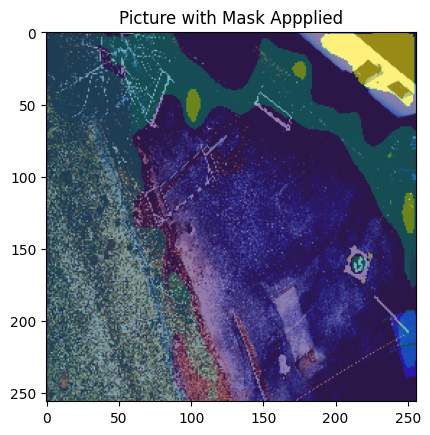

**AdamW Optimizer та CrossEntropyDiceLoss pixel-wise loss function; epoch = 20, learning_rate = 0.001 to 0.0005 to 0.0002 to 0.00009, weight_decay = 0.0001. Started from loss = 3.8 finished at 2.1**

100%|██████████| 43/43 [06:53<00:00,  9.62s/it]
Epoch:1/15.. Loss: 2.706.. mIoU:0.121.. Pixel Accuracy:0.586.. Learning Rate:0.0015342004502507077.. Time: 6.89m
100%|██████████| 43/43 [07:16<00:00, 10.15s/it]
Epoch:2/15.. Loss: 2.715.. mIoU:0.117.. Pixel Accuracy:0.578.. Learning Rate:0.004400797358774122.. Time: 7.27m
100%|██████████| 43/43 [06:59<00:00,  9.76s/it]
Epoch:3/15.. Loss: 2.685.. mIoU:0.117.. Pixel Accuracy:0.570.. Learning Rate:0.007645084265430847.. Time: 7.00m
100%|██████████| 43/43 [06:51<00:00,  9.58s/it]
Epoch:4/15.. Loss: 2.696.. mIoU:0.110.. Pixel Accuracy:0.550.. Learning Rate:0.009733864640940658.. Time: 6.87m
100%|██████████| 43/43 [06:52<00:00,  9.58s/it]
Epoch:5/15.. Loss: 2.613.. mIoU:0.112.. Pixel Accuracy:0.566.. Learning Rate:0.009938849458958864.. Time: 6.87m
100%|██████████| 43/43 [06:50<00:00,  9.54s/it]
Epoch:6/15.. Loss: 2.519.. mIoU:0.120.. Pixel Accuracy:0.581.. Learning Rate:0.009489642368402749.. Time: 6.84m
100%|██████████| 43/43 [06:49<00:00,  9.53s/it]
Epoch:7/15.. Loss: 2.345.. mIoU:0.133.. Pixel Accuracy:0.617.. Learning Rate:0.008641512628030803.. Time: 6.83m
100%|██████████| 43/43 [06:51<00:00,  9.57s/it]
Epoch:8/15.. Loss: 2.362.. mIoU:0.130.. Pixel Accuracy:0.607.. Learning Rate:0.007469820287231136.. Time: 6.86m
100%|██████████| 43/43 [06:51<00:00,  9.58s/it]
Epoch:9/15.. Loss: 2.336.. mIoU:0.131.. Pixel Accuracy:0.607.. Learning Rate:0.006078675352370941.. Time: 6.87m
100%|██████████| 43/43 [06:52<00:00,  9.60s/it]
Epoch:10/15.. Loss: 2.298.. mIoU:0.134.. Pixel Accuracy:0.620.. Learning Rate:0.004591687155851542.. Time: 6.88m
100%|██████████| 43/43 [07:13<00:00, 10.08s/it]
Epoch:11/15.. Loss: 2.266.. mIoU:0.135.. Pixel Accuracy:0.621.. Learning Rate:0.0031409811244739053.. Time: 7.23m
100%|██████████| 43/43 [06:58<00:00,  9.73s/it]
Epoch:12/15.. Loss: 2.229.. mIoU:0.140.. Pixel Accuracy:0.634.. Learning Rate:0.0018554588554444932.. Time: 6.97m
100%|██████████| 43/43 [06:55<00:00,  9.66s/it]
Epoch:13/15.. Loss: 2.229.. mIoU:0.143.. Pixel Accuracy:0.632.. Learning Rate:0.0008493446437881272.. Time: 6.93m
100%|██████████| 43/43 [06:52<00:00,  9.59s/it]
Epoch:14/15.. Loss: 2.169.. mIoU:0.146.. Pixel Accuracy:0.648.. Learning Rate:0.00021203615246996894.. Time: 6.88m
100%|██████████| 43/43 [06:51<00:00,  9.57s/it]
Epoch:15/15.. Loss: 2.163.. mIoU:0.146.. Pixel Accuracy:0.650.. Learning Rate:1.6103772588688545e-07.. Time: 6.86m
Total time: 104.05 m


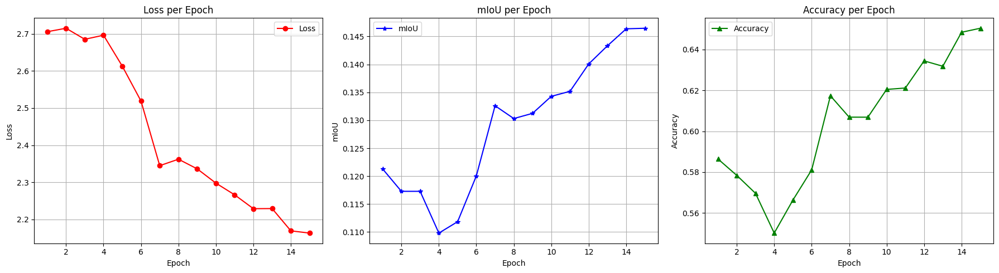

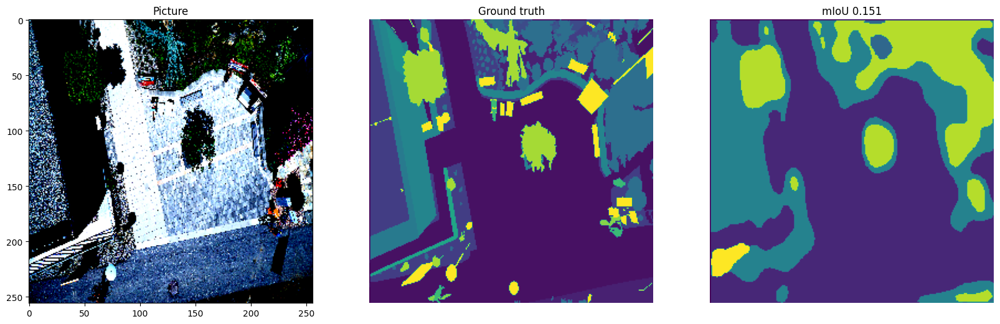

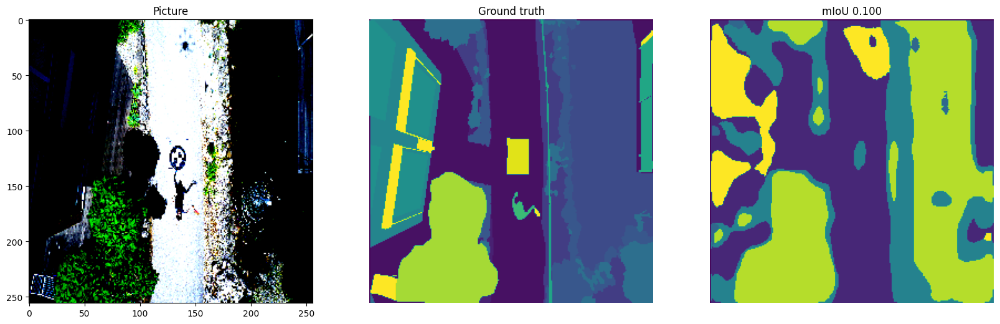

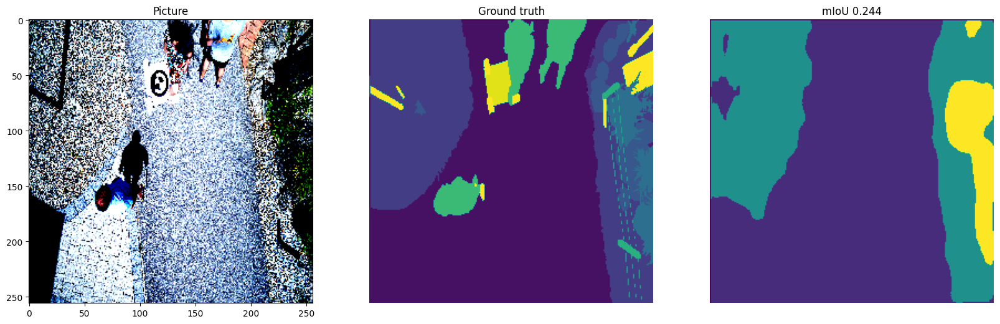

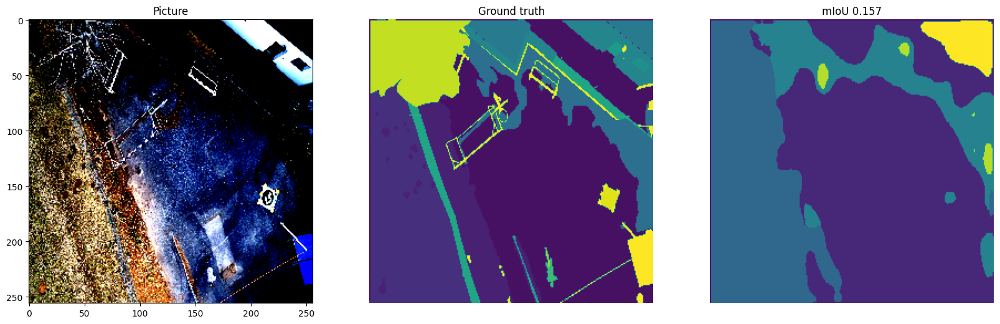

#### 5б. Запрограмувати архітектуру нейронної мережі типу Mask R-CNN. Paper: https://arxiv.org/pdf/1703.06870


* Backbone: Simple CNN for feature extraction
* RPN: Generates bounding boxes
* RoI Align: Pools regions of interest
* Mask Head: Predicts binary masks
* Classifier: Predicts object classes

##### Додатковий препроцесинг датасету для Instance Segmentation

In [34]:
id_to_class_name = {
    0: 'unlabeled',
    1: 'paved-area',
    2: 'dirt',
    3: 'grass',
    4: 'gravel',
    5: 'water',
    6: 'rocks',
    7: 'pool',
    8: 'vegetation',
    9: 'roof',
    10: 'wall',
    11: 'window',
    12: 'door',
    13: 'fence',
    14: 'fence-pole',
    15: 'person',
    16: 'dog',
    17: 'car',
    18: 'bicycle',
    19: 'tree',
    20: 'bald-tree',
    21: 'ar-marker',
    22: 'obstacle',
    23: 'conflicting'
}

In [107]:
chosen_id_to_class_name = {
    15: 'person',
    16: 'dog',
    17: 'car',
    18: 'bicycle',
}

In [54]:
class DroneDataset_PlusLabelsBoxes(Dataset):
    def __init__(self, img_path, mask_path, X, mean, std, transform=None, patch=False):
        self.img_path = img_path
        self.mask_path = mask_path
        self.X = X
        self.transform = transform
        self.patches = patch
        self.mean = mean
        self.std = std

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        img = cv2.imread(self.img_path + self.X[idx] + '.jpg')
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(self.mask_path + self.X[idx] + '.png', cv2.IMREAD_GRAYSCALE)

        if self.transform is not None:
            aug = self.transform(image=img, mask=mask)
            img = Image.fromarray(aug['image'])
            mask = aug['mask']

        if self.transform is None:
            img = Image.fromarray(img)

        # t = T.Compose([T.ToTensor(), T.Normalize(self.mean, self.std)])
        t = T.Compose([T.ToTensor()])

        img = t(img)
        mask = torch.from_numpy(mask).long()
        
        unique_values = torch.unique(mask)
        obj_ids = unique_values[torch.isin(unique_values, torch.tensor([15, 16, 17, 18]))]

        masks = mask == obj_ids[:, None, None]
              
        boxes = []
        valid_obj_ids = []
        valid_masks = []

        for obj_id, obj_mask in zip(obj_ids, masks):
            pos = torch.where(obj_mask)
            xmin = torch.min(pos[1])
            xmax = torch.max(pos[1])
            ymin = torch.min(pos[0])
            ymax = torch.max(pos[0])

            if xmax > xmin and ymax > ymin:
                boxes.append([xmin, ymin, xmax, ymax])
                valid_masks.append(obj_mask)
                valid_obj_ids.append(obj_id)

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        labels = torch.as_tensor(valid_obj_ids, dtype=torch.int64)
        valid_masks = torch.stack(valid_masks)

        if len(boxes) == 0:
            return None
        
        target = {
            "boxes": boxes,
            "labels": labels,
            "masks": valid_masks,
        }
        
        return img, target

In [55]:
mean=[0.485, 0.456, 0.406]
std=[0.229, 0.224, 0.225]

# t_train = A.Compose([A.Resize(704, 1056, interpolation=cv2.INTER_NEAREST), A.HorizontalFlip(), A.VerticalFlip(),
#                      A.GridDistortion(p=0.2), A.RandomBrightnessContrast((0,0.5),(0,0.5)),
#                      A.GaussNoise()])

# t_val = A.Compose([A.Resize(704, 1056, interpolation=cv2.INTER_NEAREST), A.HorizontalFlip(),
#                    A.GridDistortion(p=0.2)])


t_train = A.Compose([A.Resize(512, 512, interpolation=cv2.INTER_NEAREST)])

t_val = A.Compose([A.Resize(512, 512, interpolation=cv2.INTER_NEAREST)])

#datasets
train_set = DroneDataset_PlusLabelsBoxes(imgs_path, masks_path, X_train, mean, std, t_train, patch=False)
val_set = DroneDataset_PlusLabelsBoxes(imgs_path, masks_path, X_val, mean, std, t_val, patch=False)

#dataloader
batch_size = 8

def collate_fn(batch):
    batch = [b for b in batch if b is not None]
    return tuple(zip(*batch))

train_loader = DataLoader(train_set, batch_size=batch_size, shuffle=True, collate_fn=collate_fn)
val_loader = DataLoader(val_set, batch_size=batch_size, shuffle=True, collate_fn=collate_fn)

##### Моделі

In [101]:
class LightweightEncoder(nn.Module):
    def __init__(self):
        self.out_channels = 256
        super(LightweightEncoder, self).__init__()
        self.conv1 = nn.Conv2d(3, 16, kernel_size=3, stride=2, padding=1)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=3, stride=2, padding=1)
        self.conv3 = nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1)
        self.conv4 = nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1)
        self.conv5 = nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1)
        
    def forward(self, x):
        x1 = self.conv1(x)
        x1 = nn.ReLU()(x1)
        
        x2 = self.conv2(x1)
        x2 = nn.ReLU()(x2)
        
        x3 = self.conv3(x2)
        x3 = nn.ReLU()(x3)
        
        x4 = self.conv4(x3)
        x4 = nn.ReLU()(x4)
        
        x5 = self.conv5(x4)
        
        return x5

In [ ]:
from torchvision.models.detection import MaskRCNN
from torchvision.models.detection.rpn import AnchorGenerator
from torchvision.ops import MultiScaleRoIAlign


class MaskRCNN_Torch(nn.Module):
    def __init__(self, num_classes):
        super(MaskRCNN_Torch, self).__init__()
        
        encoder = LightweightEncoder()
        
        anchor_generator = AnchorGenerator(
            sizes=((32, 64, 128, 256, 512),),
            aspect_ratios=((0.5, 1.0, 2.0),)
        )
        
        roi_pooler = MultiScaleRoIAlign (
            featmap_names=['0', '1', '2', '3'],
            output_size=5,
            sampling_ratio=2
        )
        
        self.model = MaskRCNN(
            encoder,
            num_classes=num_classes,
            rpn_anchor_generator=anchor_generator,
            box_roi_pool=roi_pooler
        )
    
    def forward(self, images, targets=None):
        return self.model(images, targets)
    
model1 = MaskRCNN_Torch(4)

In [ ]:
class SimpleMaskRCNN(nn.Module):
    def __init__(self, num_classes):
        super(SimpleMaskRCNN, self).__init__()

        backbone = torchvision.models.resnet18(weights="DEFAULT")
        
        backbone = nn.Sequential(*list(backbone.children())[:-2])
        
        fpn = torchvision.models.detection.backbone_utils.BackboneWithFPN(
            backbone,
            return_layers={'4': '0', '5': '1'},
            in_channels_list=[64, 128],
            out_channels=256
        )
        
        anchor_generator = AnchorGenerator(
            sizes=((32, 64, 128, 256, 512),),
            aspect_ratios=((0.5, 1.0, 2.0),)
        )
        
        roi_pooler = MultiScaleRoIAlign(
            featmap_names=['0', '1'],
            output_size=7,
            sampling_ratio=2
        )
        
        self.model = MaskRCNN(
            fpn,
            num_classes=num_classes,
            rpn_anchor_generator=anchor_generator,
            box_roi_pool=roi_pooler
        )

    def forward(self, images, targets=None):
        return self.model(images, targets)

model2 = SimpleMaskRCNN(4)


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to C:\Users\Anna/.cache\torch\hub\checkpoints\resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:08<00:00, 5.43MB/s]


In [104]:
class SimpleBackbone(nn.Module):
    def __init__(self):
        super(SimpleBackbone, self).__init__()
        self.conv1 = nn.Conv2d(3, 16, kernel_size=3, stride=2, padding=1)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=3, stride=2, padding=1)
        self.conv3 = nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1)
        self.conv4 = nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1)
        self.conv5 = nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1)
    
    def forward(self, x):
        x1 = F.relu(self.conv1(x))
        x2 = F.relu(self.conv2(x1))
        x3 = F.relu(self.conv3(x2))
        x4 = F.relu(self.conv4(x3))
        x5 = F.relu(self.conv5(x4))
        return {0: x1,
                1: x2,
                2: x3,
                3: x4,
                4: x5}

class MaskRCNNHead(nn.Module):
    def __init__(self, in_channels, num_classes):
        super(MaskRCNNHead, self).__init__()
        self.fc1 = nn.Linear(in_channels, 1024)
        self.fc2 = nn.Linear(1024, num_classes)
        self.mask = nn.Conv2d(in_channels, num_classes, kernel_size=1)
    
    def forward(self, x):
        x_flat = x.view(x.size(0), -1)
        x = F.relu(self.fc1(x_flat))
        class_logits = self.fc2(x)
        mask_preds = self.mask(x.view(x.size(0), x.size(1), 1, 1))
        return class_logits, mask_preds

class SimpleMaskRCNN2(nn.Module):
    def __init__(self, num_classes):
        super(SimpleMaskRCNN, self).__init__()
        
        backbone = SimpleBackbone()
        
        rpn_anchor_generator = AnchorGenerator(
            sizes=((32, 64, 128, 256, 512),),
            aspect_ratios=((0.5, 1.0, 2.0),)
        )
        
        roi_pooler = MultiScaleRoIAlign(
            featmap_names=['0', '1', '2', '3'],
            output_size=7,
            sampling_ratio=2
        )
        
        self.model = MaskRCNN(
            backbone,
            num_classes=num_classes,
            rpn_anchor_generator=rpn_anchor_generator,
            box_roi_pool=roi_pooler
        )
    
    def forward(self, images, targets=None):
        return self.model(images, targets)


##### Фінальна версія

In [105]:
class BottleNeck(nn.Module):
    def __init__(self, outside_channels, inside_channels):
        super(BottleNeck, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(outside_channels, inside_channels, 1, stride=1, bias=False),
            nn.BatchNorm2d(inside_channels),
            nn.Conv2d(inside_channels, inside_channels, 3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(inside_channels),
            nn.Conv2d(inside_channels, outside_channels, 1, stride=1, bias=False),
            nn.BatchNorm2d(outside_channels),
            nn.ReLU6(inplace=True)
            )

    def forward(self, x):
        return self.conv(x)

In [106]:
class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU6(inplace=True),
            nn.Conv2d(out_channels, out_channels, 3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU6(inplace=True)
            )

    def forward(self, x):
        return self.conv(x)

In [109]:
class Encoder(nn.Module):
    def __init__(self):
        self.out_channels = 512
        super(Encoder, self).__init__()
        self.conv1 = DoubleConv(3, 16)
        self.conv2 = DoubleConv(16, 32)
        self.conv3 = BottleNeck(32, 16)
        self.conv4 = DoubleConv(64, 128)
        self.conv5 = DoubleConv(128, 256)
        self.conv6 = BottleNeck(256, 64)
        self.conv7 = BottleNeck(256, 128)
        self.conv8 = DoubleConv(256, 512)
        self.conv9 = BottleNeck(512, 128)
        self.conv10 = BottleNeck(512, 256)
        self.conv11 = DoubleConv(512, 512)
        
    def forward(self, x):
        x1 = self.conv1(x)  # (B, 16, H/2, W/2)
        x2 = self.conv2(x1)  # (B, 32, H/4, W/4)
        x3 = self.conv3(x2)  # (B, 16, H/8, W/8)
        x4 = self.conv4(x3)  # (B, 128, H/16, W/16)
        x5 = self.conv5(x4)  # (B, 256, H/32, W/32)
        x6 = self.conv6(x5)  # (B, 64, H/64, W/64)
        x7 = self.conv7(x6)  # (B, 128, H/128, W/128)
        x8 = self.conv8(x7)  # (B, 512, H/256, W/256)
        x9 = self.conv9(x8)  # (B, 128, H/512, W/512)
        x10 = self.conv10(x9)  # (B, 256, H/1024, W/1024)
        x11 = self.conv11(x10)  # (B, 512, H/2048, W/2048)

        return x1, x2, x3, x4, x5, x6, x7, x8, x9, x10, x11

In [110]:
class FeaturePyramidNetwork(nn.Module):
    def __init__(self, in_channels_list, out_channels):
        super(FeaturePyramidNetwork, self).__init__()
        self.fpn_convs = nn.ModuleList([
            nn.Conv2d(in_channels, out_channels, kernel_size=1) for in_channels in in_channels_list
        ])
        self.top_down_convs = nn.ModuleList([
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1) for _ in in_channels_list
        ])
    
    def forward(self, feature_maps):
        outputs = []
        for idx, feature_map in enumerate(feature_maps):
            fpn_out = self.fpn_convs[idx](feature_map)
            top_down_out = self.top_down_convs[idx](fpn_out)
            outputs.append(top_down_out)
        return outputs

In [113]:
class BackboneWithFPN(nn.Module):
    def __init__(self, backbone, fpn):
        self.out_channels = 512
        super(BackboneWithFPN, self).__init__()
        self.backbone = backbone
        self.fpn = fpn

    def forward(self, x):
        feature_maps = self.backbone(x)
        return self.fpn(feature_maps)

In [ ]:
class MaskRCNN_Mine(nn.Module):
    def __init__(self, num_classes):
        super(MaskRCNN_Mine, self).__init__()
        
        backbone = Encoder()
        
        fpn = FeaturePyramidNetwork(
            in_channels_list=[16, 32, 64, 128, 256, 512],
            out_channels=512
        )
        
        backbone_with_fpn = BackboneWithFPN(backbone, fpn)
        
        rpn_anchor_generator = AnchorGenerator(
            sizes=(
                (8, 16, 32, 64, 128), 
                (16, 32, 64, 128, 256), 
                (32, 64, 128, 256, 512), 
                (64, 128, 256, 512, 1024), 
                (128, 256, 512, 1024, 2048), 
            ),
            aspect_ratios=(
                (0.5, 1.0, 2.0),
                (0.5, 1.0, 2.0),
                (0.5, 1.0, 2.0),
                (0.5, 1.0, 2.0),
                (0.5, 1.0, 2.0),
            )
        )
        
        roi_pooler = MultiScaleRoIAlign(
            featmap_names=['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10'], 
            output_size=14,
            sampling_ratio=4 
        )
        
        self.model = MaskRCNN(
            backbone=backbone_with_fpn,
            num_classes=num_classes,
            rpn_anchor_generator=rpn_anchor_generator,
            box_roi_pool=roi_pooler
        )
    
    def forward(self, images, targets=None):
        return self.model(images, targets)
    
model = MaskRCNN_Mine(4)

In [115]:
model

MaskRCNN_Mine(
  (model): MaskRCNN(
    (transform): GeneralizedRCNNTransform(
        Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        Resize(min_size=(800,), max_size=1333, mode='bilinear')
    )
    (backbone): BackboneWithFPN(
      (backbone): Encoder(
        (conv1): DoubleConv(
          (conv): Sequential(
            (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): ReLU6(inplace=True)
            (3): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (4): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (5): ReLU6(inplace=True)
          )
        )
        (conv2): DoubleConv(
          (conv): Sequential(
            (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (1): BatchNorm

In [ ]:
optimizer = torch.optim.AdamW(model.parameters(), lr=0.005, weight_decay=0.0005)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)


In [ ]:
import torch
from torchvision.ops import box_iou

num_epochs = 5

train_loss = []
train_box_iou = []
train_mask_iou = []
for epoch in range(num_epochs):
    model.train()
    epoch_loss = 0
    total_iou = 0
    total_mask_iou = 0
    total_detections = 0
    total_groundtruths = 0

    for images, targets in train_loader:
        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())
        epoch_loss += losses.item()

        for target, output in zip(targets, model(images, targets)):
            pred_boxes = output['boxes']
            gt_boxes = target['boxes']
            if len(pred_boxes) > 0 and len(gt_boxes) > 0:
                iou = box_iou(pred_boxes, gt_boxes)
                total_iou += iou.mean().item()
                total_detections += len(pred_boxes)
                total_groundtruths += len(gt_boxes)

            pred_masks = output['masks']
            gt_masks = target['masks']
            pred_masks = pred_masks > 0.5
            mask_iou = (pred_masks & gt_masks).sum() / (pred_masks | gt_masks).sum()
            total_mask_iou += mask_iou.item()

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

    lr_scheduler.step()
    
    avg_loss = epoch_loss / len(train_loader)
    avg_iou = total_iou / total_detections if total_detections > 0 else 0
    avg_mask_iou = total_mask_iou / total_detections if total_detections > 0 else 0
    
    train_loss.append(avg_loss)
    train_box_iou.append(avg_iou)
    train_mask_iou.append(avg_mask_iou)
    
    # torch.save({
    #     'model_state_dict': model.state_dict(),
    #     'optimizer_state_dict': optimizer.state_dict(),
    #     'scheduler_state_dict': lr_scheduler.state_dict(),
    # }, './models/checkpoint_imp.pth')
    
    print(f"Epoch {epoch + 1}/{num_epochs}, Loss: {avg_loss:.4f}, "
          f"Bounding Box IoU: {avg_iou:.4f}, Mask IoU: {avg_mask_iou:.4f}")

history = {'train_loss' : train_loss,
    'train_box_iou' :train_box_iou,
    'train_mask_iou' :train_mask_iou}

# timestamp = time.strftime('%Y%m%d-%H%M%S')
# filename = f'history_fcn1_{timestamp}.pkl'
# with open(filename, 'wb') as f:
#     pickle.dump(history, f)


Classification Loss.
Cross-Entropy Loss: This loss is used for the classification of each object in the image. It is computed between the predicted class logits and the true labels (ground truth). This loss encourages the model to correctly classify each object.

Bounding Box Loss
Smooth L1 Loss (Huber Loss): This is used for the localization of bounding boxes. It calculates the difference between the predicted bounding box coordinates (e.g., center, width, and height) and the ground truth bounding box coordinates. It applies a smooth L1 loss (a form of Huber loss) to ensure robustness to outliers.

Mask Loss
Binary Cross-Entropy Loss: For the segmentation task, Mask R-CNN uses binary cross-entropy loss to compute the error between the predicted mask (for each object) and the ground truth mask. It does this pixel-wise for each object in the image.

Smooth L1 Loss, also known as Huber Loss, is a regression loss function that combines the benefits of both L1 Loss and L2 Loss. It is less sensitive to outliers compared to L2 loss and avoids the sharp discontinuity of L1 loss at zero. It is widely used in tasks like bounding box regression in object detection models.

SmoothL1(x)= {0.5x^2 if ∣x∣<1, 
             ∣x∣−0.5 otherwise}

**AdamW з початковим lr=0.005 та StepLR Scheduler, weight_decay = 0.0005; Убудовані функції втрат (Cross-Entropy, Smooth L1, Binary Cross-Entropy)**

Epoch 1/20, Loss: 2.3447, Bounding Box IoU: 0.0483, Mask IoU: 0.0110

Epoch 2/20, Loss: 1.8723, Bounding Box IoU: 0.0975, Mask IoU: 0.0012

Epoch 3/20, Loss: 1.6432, Bounding Box IoU: 0.1167, Mask IoU: 0.0158

Epoch 4/20, Loss: 1.5975, Bounding Box IoU: 0.1309, Mask IoU: 0.0586

Epoch 5/20, Loss: 1.4469, Bounding Box IoU: 0.1484, Mask IoU: 0.0909

Epoch 6/20, Loss: 1.3056, Bounding Box IoU: 0.1612, Mask IoU: 0.1417

Epoch 7/20, Loss: 1.2624, Bounding Box IoU: 0.1743, Mask IoU: 0.2320

Epoch 8/20, Loss: 1.1421, Bounding Box IoU: 0.1901, Mask IoU: 0.2623

Epoch 9/20, Loss: 1.0526, Bounding Box IoU: 0.2047, Mask IoU: 0.2705

Epoch 10/20, Loss: 0.9711, Bounding Box IoU: 0.2168, Mask IoU: 0.3189

Epoch 11/20, Loss: 0.8935, Bounding Box IoU: 0.2279, Mask IoU: 0.3563

Epoch 12/20, Loss: 0.8719, Bounding Box IoU: 0.2387, Mask IoU: 0.3834

Epoch 13/20, Loss: 0.8534, Bounding Box IoU: 0.2494, Mask IoU: 0.3995

Epoch 14/20, Loss: 0.8330, Bounding Box IoU: 0.2592, Mask IoU: 0.4057

Epoch 15/20, Loss: 0.8121, Bounding Box IoU: 0.2681, Mask IoU: 0.4112

Epoch 16/20, Loss: 0.7828, Bounding Box IoU: 0.2764, Mask IoU: 0.4164

Epoch 17/20, Loss: 0.7756, Bounding Box IoU: 0.2842, Mask IoU: 0.4215

Epoch 18/20, Loss: 0.7514, Bounding Box IoU: 0.2922, Mask IoU: 0.4265

Epoch 19/20, Loss: 0.7273, Bounding Box IoU: 0.2999, Mask IoU: 0.4315

**Epoch 20/20, Loss: 0.6902, Bounding Box IoU: 0.3071, Mask IoU: 0.4365**


До тренування..

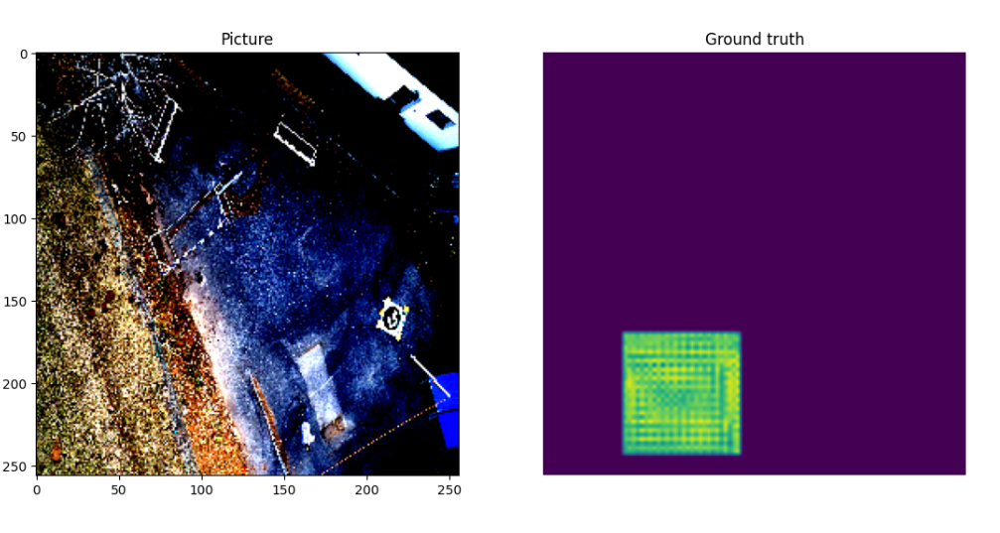

Результати (тестування)

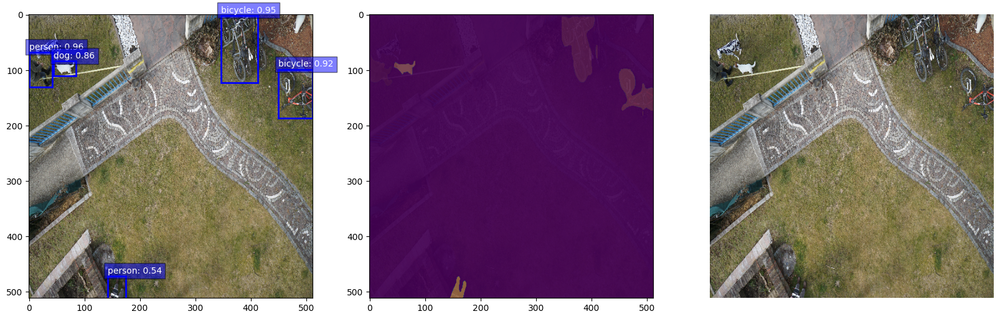

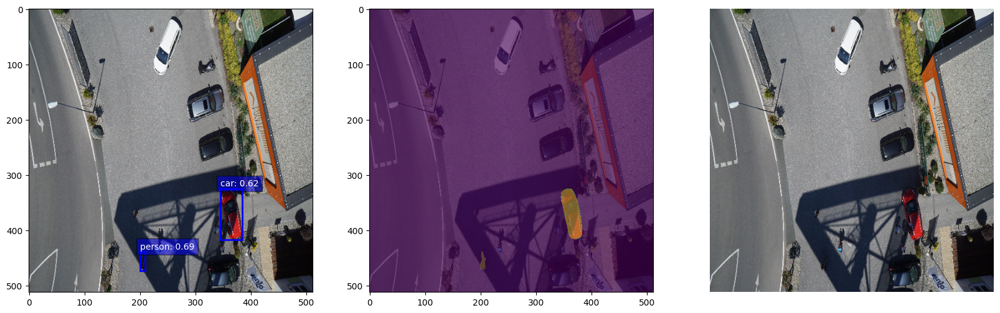

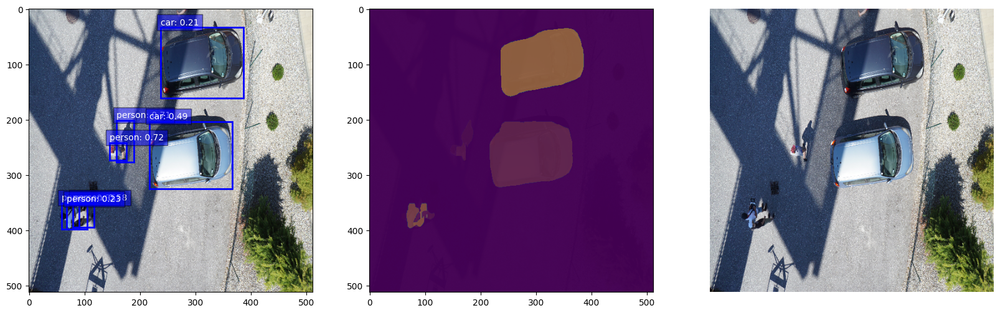

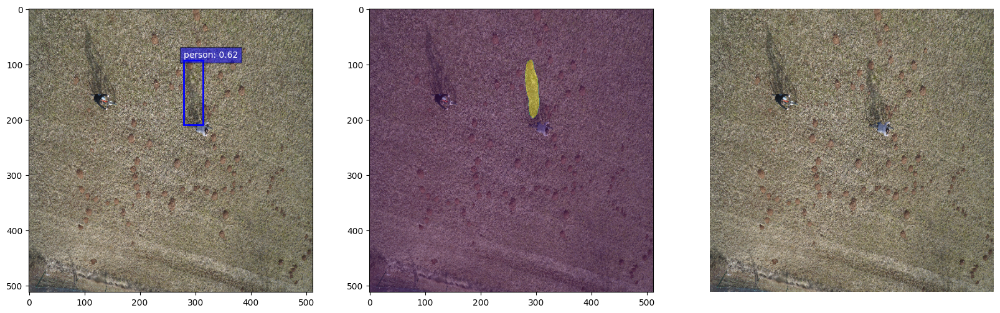

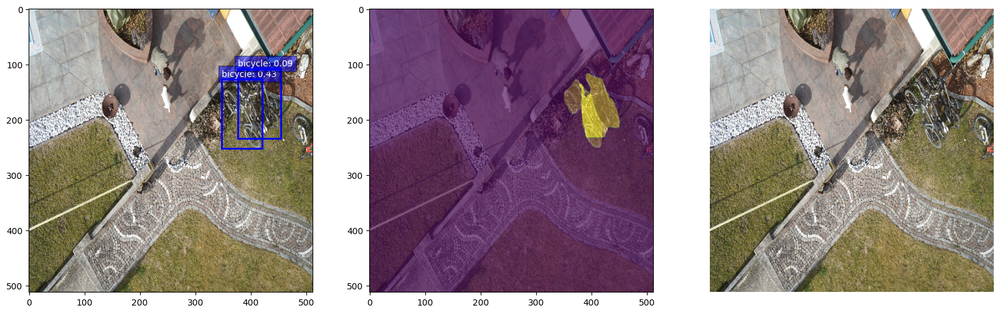

### Визначити список гіперпараметрів з їх описом та можливими значеннями.


##### 1. Загальні гіперпараметри

| Hyperparameter      | Description                                           | Possible Values                    |
|---------------------|-------------------------------------------------------|------------------------------------|
| `learning_rate`     | The speed at which the model learns. Controls weight updates. | `1e-4`, `1e-3`, `5e-4`            |
| `batch_size`        | Number of images processed together during training. | `4`, `8`, `16`                    |
| `epochs`            | Number of times the model sees the entire dataset.   | `50`, `100`, `200`               |
| `optimizer`         | Optimization algorithm for minimizing loss.          | `Adam`, `SGD`, `RMSprop`          |
| `weight_decay`      | Regularization to prevent overfitting.               | `0`, `1e-5`, `1e-4`               |
| `dropout_rate`      | Percentage of neurons to drop out for regularization.| `0.2`, `0.3`, `0.5`               |
| `input_size`        | Input image size.                                    | `(256, 256)`                      |
| `layers_number`        | Number of layers in the Neural Network.                                    | `2, 4, 6, 8`                      |
| `channels_number`        | Number of channels in the colorful (RGB) image that remain non-zero.                                    | `1, 2, 3`                      |
| `loss_function`        | Function to compute the loss during the training and validation                                    | `Cross-Entropy Loss, Dice Loss, Focal Loss, Jaccard (IoU) Loss, Sparse Cross-Entropy Loss`                 |

##### 2. FCN (Fully Convolutional Network) гіперпараметри
FCN використовує згорткові шари та upsampling (деконволюцію) для відновлення просторової роздільної здатності (spacial resolution) зображення.

| Hyperparameter      | Description                                           | Possible Values                    |
|---------------------|-------------------------------------------------------|------------------------------------|
| `num_filters`       | Number of filters in convolutional layers.           | `64`, `128`, `256`                |
| `kernel_size`       | Size of the filter for convolution operations.       | `3`, `5`                          |
| `stride`            | Step size for the convolution.                       | `1`, `2`                          |
| `padding`           | Padding type for convolutional layers.               | `0, 1, 2`                  |
| `upscaling_factor`  | Factor for increasing resolution during upsampling.  | `2`, `4`, `8`                     |
| `activation`        | Activation function for layers.                      | `ReLU`, `tanh`, `LeakyReLU`               |

##### 3. Mask R-CNN гіперпараметри
Mask R-CNN розширює Faster R-CNN, додаючи mask prediction head для сегментації.

| Hyperparameter      | Description                                           | Possible Values                    |
|---------------------|-------------------------------------------------------|------------------------------------|
| `backbone`          | Feature extractor architecture (backbone).           | `ResNet50`, `ResNet101`           |
| `rpn_nms_threshold` | NMS threshold for the Region Proposal Network (RPN). | `0.5`, `0.7`                      |
| `roi_pool_size`     | Output size after RoI Align.                         | `(7, 7)`, `(14, 14)`              |
| `mask_head_layers`  | Number of layers in the mask head.                   | `2`, `4`                          |
| `mask_loss_weight`  | Loss weight for the mask prediction.                 | `1.0`, `0.5`, `0.25`              |
| `anchor_sizes`      | Sizes of anchors for RPN.                            | `[32, 64, 128, 256, 512]`         |
| `anchor_ratios`     | Aspect ratios of anchors.                            | `[0.5, 1.0, 2.0]`                 |


##### 4. AlexNet гіперпараметри
AlexNet як feature extractor моделі та відповідний класифікатор, наприклад, SVM або KNN.

| Hyperparameter          | Description                                                   | Possible Values          |
|-------------------------|---------------------------------------------------------------|--------------------------|
| `num_features_alexnet`  | Number of features extracted from AlexNet                     | `256`, `512`, `1024`     |
| `classifier_type`       | Type of classifier used after feature extraction              | `SVM`, `KNN`             |
| `svm_kernel`            | Kernel type for SVM classifier                                | `linear`, `rbf`, `poly`  |
| `knn_neighbors`         | Number of neighbors for KNN classifier                        | `3`, `5`, `7`            |
| `dropout_rate_alexnet`  | Dropout probability for regularization in AlexNet layers      | `0.2`, `0.3`, `0.5`      |
| `feature_layer`         | AlexNet layer where feature extraction stops (before classifier) | `conv5`, `fc6`, `fc7`   |
| `pooling_type`          | Type of pooling applied to extracted features                 | `max`, `average`         |
| `activation_function`   | Activation function used in additional layers                 | `ReLU`, `LeakyReLU`, `tanh`      |


##### 5. Додаткові гіперпараметри для різних оптимізаторів

| Hyperparameter      | Description                                           | Possible Values                    |
|---------------------|-------------------------------------------------------|------------------------------------|
| `momentum`          | Momentum parameter for SGD, affecting weight updates.| `0.9`, `0.95`                      |
| `beta1`, `beta2`    | Parameters for Adam optimizer controlling momentum.  | `0.9, 0.999`, `0.8, 0.99`          |
| `lr_scheduler`      | Method for adjusting the learning rate during training.| `StepLR`, `ReduceLROnPlateau`     |
| `scheduler_step`    | Number of epochs before reducing the learning rate.  | `10`, `20`                        |
| `scheduler_gamma`   | Factor by which the learning rate is reduced.        | `0.1`, `0.5`                      |

##### Додаткове пояснення вибору

1. **`learning_rate`** визначає швидкість навчання і є критичним для стабільного тренування
2. **`batch_size`** впливає на використання пам’яті та стабільність тренування
3. **`optimizer`** визначає швидкість збіжності та стабільність моделі
4. **`backbone`** у Mask R-CNN відповідає за якість extracted features і загальну продуктивність моделі
5. **`rpn_nms_threshold`** контролює кількість пропозицій, вибраних після роботи RPN (Region Proposal Network)
6. **`mask_loss_weight`** дозволяє збалансувати втрати між класифікацією, регресією меж об’єктів та сегментацією маски

Цей список гіперпараметрів та їх можливі значення можна використовувати як базову основу для налаштування моделей.

### Висновки

**3б. AlexNet + KNN**

Переваги: Простота реалізації, особливо як feature extractor. Швидка обробка завдяки невеликій кількості шарів у порівнянні з сучасними архітектурами.

Недоліки: AlexNet була розроблена для класифікації, тому її адаптація до сегментації через переконфігурацію fully connected шарів на convolutional layers має обмежену ефективність. Модель не враховує контексту на високих рівнях, що є важливим для точного сегментування.

Добре підходить для простих задач з невеликою кількістю класів, але не здатна змагатися із сучасними моделями для складних задач.

  
**4б. FCN**

Перетворює fully connected шари на convolutional для піксельної сегментації.
FCN — гарна база, але сучасні архітектури (DeepLab, U-Net) перевершують її. Також не вистачає передтренування.

Переваги: Перетворення fully connected шарів у convolutional дозволяє виконувати сегментацію на рівні пікселів. Ефективно працює на великих наборах даних та забезпечує краще узагальнення порівняно з AlexNet.

Недоліки: Обмежена точність через втрату деталізації під час max-pooling, що може впливати на якість сегментації дрібних об’єктів. Не використовує механізмів зворотного підвищення роздільної здатності (як у сучасних моделей, таких як U-Net).

FCN забезпечує суттєве покращення порівняно з AlexNet, особливо для задач із чіткими межами об'єктів.

**5б. Mask R-CNN**

Вдосконалює Faster R-CNN, додаючи сегментацію на рівні пікселів (mask head).

Переваги: Виконує сегментацію об’єктів одночасно із завданням їх виявлення (instance segmentation), що дозволяє працювати з індивідуальними об’єктами на зображенні. Використовує ROIAlign для точного обчислення меж, що покращує якість сегментації. Може додатково враховувати контекст завдяки своїй архітектурі.

Недоліки: Більш ресурсомістка, ніж AlexNet та FCN, потребує більше пам’яті та часу для тренування.

Найкращий вибір для складних задач сегментації, де потрібна висока точність та деталізація. Показує значно вищі результати в порівнянні з AlexNet та FCN, особливо на задачах із множинними класами. Але дуууууже довго тренується

### Training&Validation&Testing help functions

In [15]:
def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']

def fit(epochs, model, train_loader, val_loader, criterion, optimizer, scheduler=None, patch=False):
    torch.cuda.empty_cache()
    train_losses = []
    val_iou = []; val_acc = []
    train_iou = []; train_acc = []
    lrs = []
    min_loss = np.inf
    decrease = 1 ; not_improve=0

    model.to(DEVICE)
    fit_time = time.time()
    for e in range(epochs):
        since = time.time()
        running_loss = 0
        iou_score = 0
        accuracy = 0

        #training loop
        model.train()
        for i, data in enumerate(tqdm(train_loader)):
            #training phase
            image_tiles, mask_tiles = data
            if patch:
                bs, n_tiles, c, h, w = image_tiles.size()

                image_tiles = image_tiles.view(-1, c, h, w)
                mask_tiles = mask_tiles.view(-1, h, w)

            image = image_tiles.to(DEVICE)
            mask = mask_tiles.to(DEVICE)

            #forward
            output = model(image)
            loss = criterion(output, mask)

            #evaluation metrics
            iou_score += mIoU(output, mask)
            accuracy += pixel_accuracy(output, mask)

            #backward
            loss.backward()
            optimizer.step() #update weight
            optimizer.zero_grad() #reset gradient

            if scheduler is not None:
                lrs.append(get_lr(optimizer))
                scheduler.step()

            running_loss += loss.item()

        train_losses.append(running_loss/len(train_loader))
        train_iou.append(iou_score/len(train_loader))
        train_acc.append(accuracy/len(train_loader))

        torch.save(model, './models/model_last_epoch.pt')
        
        print("Epoch:{}/{}..".format(e+1, epochs),
                      "Loss: {:.3f}..".format(running_loss/len(train_loader)),
                      # "Val Loss: {:.3f}..".format(test_loss/len(val_loader)),
                      "mIoU:{:.3f}..".format(iou_score/len(train_loader)),
                      # "Val mIoU: {:.3f}..".format(val_iou_score/len(val_loader)),
                      "Pixel Accuracy:{:.3f}..".format(accuracy/len(train_loader)),
                      "Learning Rate:{}..".format(get_lr(optimizer)),
                      # "Val Acc:{:.3f}..".format(test_accuracy/len(val_loader)),
                      "Time: {:.2f}m".format((time.time()-since)/60))

    history = {'train_loss' : train_losses,
               'train_miou' :train_iou,
               'train_acc' :train_acc,
               'train_lrs': lrs}
    print('Total time: {:.2f} m' .format((time.time()- fit_time)/60))
    return history



In [ ]:
def predict_image_mask_miou(model, image, mask, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    model.eval()
    model.to(DEVICE); image=image.to(DEVICE)
    mask = mask.to(DEVICE)
    with torch.no_grad():

        image = image.unsqueeze(0)
        mask = mask.unsqueeze(0)

        output = model(image)
        print("Output shape:", output.shape)  # Shape from the model
        print("Mask shape:", mask.shape)      # Shape of ground truth

        score = mIoU(output, mask)
        masked = torch.argmax(output, dim=1)
        masked = masked.cpu().squeeze(0)
    return masked, score

In [17]:
def plot_loss(history):
    # plt.plot(history['val_loss'], label='val', marker='o')
    plt.plot( history['train_loss'], label='loss', marker='o')
    plt.title('Loss per epoch'); plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(), plt.grid()
    plt.show()

def plot_score(history):
    plt.plot(history['train_miou'], label='mIoU', marker='*')
    # plt.plot(history['val_miou'], label='val_mIoU',  marker='*')
    plt.title('Score per epoch'); plt.ylabel('mean IoU')
    plt.xlabel('epoch')
    plt.legend(), plt.grid()
    plt.show()

def plot_acc(history):
    plt.plot(history['train_acc'], label='accuracy', marker='*')
    # plt.plot(history['val_acc'], label='val_accuracy',  marker='*')
    plt.title('Accuracy per epoch'); plt.ylabel('Accuracy')
    plt.xlabel('epoch')
    plt.legend(), plt.grid()
    plt.show()
    
def plot_metrics(history):
    epochs = range(1, len(history['train_loss']) + 1)
    
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))

    axes[0].plot(epochs, history['train_loss'], label='Loss', marker='o', color='red')
    axes[0].set_title('Loss per Epoch')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Loss')
    axes[0].legend()
    axes[0].grid()

    axes[1].plot(epochs, history['train_miou'], label='mIoU', marker='*', color='blue')
    axes[1].set_title('mIoU per Epoch')
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('mIoU')
    axes[1].legend()
    axes[1].grid()

    axes[2].plot(epochs, history['train_acc'], label='Accuracy', marker='^', color='green')
    axes[2].set_title('Accuracy per Epoch')
    axes[2].set_xlabel('Epoch')
    axes[2].set_ylabel('Accuracy')
    axes[2].legend()
    axes[2].grid()

    plt.tight_layout()
    plt.show()

### Тренування

In [ ]:
torch.save(model, './models/model.pt')
torch.save({
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'scheduler_state_dict': scheduler.state_dict(),
    'history': history,
}, './models/checkpoint.pth')

In [ ]:
# checkpoint = torch.load('./models/checkpoint.pth')
# model.load_state_dict(checkpoint['model_state_dict'], strict=False)
# optimizer.load_state_dict(checkpoint['optimizer_state_dict'], strict=False)
# scheduler.load_state_dict(checkpoint['scheduler_state_dict'])

# for param_group in optimizer.param_groups:
#     param_group['lr'] = new_learning_rate

# model = torch.load('./models/FCN8_VGG16_ImageNet.pt')

C:\Users\Anna\AppData\Local\Temp\ipykernel_34660\2398378555.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('./models/FCN8_VGG16_ImageNet.pt')


In [ ]:
max_lr = 0.01
epoch = 15
weight_decay = 1e-4

criterion = CrossEntropyDiceLoss()

optimizer = torch.optim.AdamW(model.parameters(), lr=max_lr, weight_decay=weight_decay)
sched = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr, epochs=epoch,
                                            steps_per_epoch=len(train_loader))


history = fit(epoch, model, train_loader, val_loader, criterion, optimizer, scheduler=sched)
torch.save(model, './models/mmm.pt')

torch.save({
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'scheduler_state_dict': sched.state_dict(),
    'history': history,
}, './models/checkpoint1.pth')

with open('history_fcn1.pkl', 'wb') as f:
    pickle.dump(history, f)

100%|██████████| 43/43 [06:53<00:00,  9.62s/it]


Epoch:1/15.. Loss: 2.706.. mIoU:0.121.. Pixel Accuracy:0.586.. Learning Rate:0.0015342004502507077.. Time: 6.89m


100%|██████████| 43/43 [07:16<00:00, 10.15s/it]


Epoch:2/15.. Loss: 2.715.. mIoU:0.117.. Pixel Accuracy:0.578.. Learning Rate:0.004400797358774122.. Time: 7.27m


100%|██████████| 43/43 [06:59<00:00,  9.76s/it]


Epoch:3/15.. Loss: 2.685.. mIoU:0.117.. Pixel Accuracy:0.570.. Learning Rate:0.007645084265430847.. Time: 7.00m


100%|██████████| 43/43 [06:51<00:00,  9.58s/it]


Epoch:4/15.. Loss: 2.696.. mIoU:0.110.. Pixel Accuracy:0.550.. Learning Rate:0.009733864640940658.. Time: 6.87m


100%|██████████| 43/43 [06:52<00:00,  9.58s/it]


Epoch:5/15.. Loss: 2.613.. mIoU:0.112.. Pixel Accuracy:0.566.. Learning Rate:0.009938849458958864.. Time: 6.87m


100%|██████████| 43/43 [06:50<00:00,  9.54s/it]


Epoch:6/15.. Loss: 2.519.. mIoU:0.120.. Pixel Accuracy:0.581.. Learning Rate:0.009489642368402749.. Time: 6.84m


100%|██████████| 43/43 [06:49<00:00,  9.53s/it]


Epoch:7/15.. Loss: 2.345.. mIoU:0.133.. Pixel Accuracy:0.617.. Learning Rate:0.008641512628030803.. Time: 6.83m


100%|██████████| 43/43 [06:51<00:00,  9.57s/it]


Epoch:8/15.. Loss: 2.362.. mIoU:0.130.. Pixel Accuracy:0.607.. Learning Rate:0.007469820287231136.. Time: 6.86m


100%|██████████| 43/43 [06:51<00:00,  9.58s/it]


Epoch:9/15.. Loss: 2.336.. mIoU:0.131.. Pixel Accuracy:0.607.. Learning Rate:0.006078675352370941.. Time: 6.87m


100%|██████████| 43/43 [06:52<00:00,  9.60s/it]


Epoch:10/15.. Loss: 2.298.. mIoU:0.134.. Pixel Accuracy:0.620.. Learning Rate:0.004591687155851542.. Time: 6.88m


100%|██████████| 43/43 [07:13<00:00, 10.08s/it]


Epoch:11/15.. Loss: 2.266.. mIoU:0.135.. Pixel Accuracy:0.621.. Learning Rate:0.0031409811244739053.. Time: 7.23m


100%|██████████| 43/43 [06:58<00:00,  9.73s/it]


Epoch:12/15.. Loss: 2.229.. mIoU:0.140.. Pixel Accuracy:0.634.. Learning Rate:0.0018554588554444932.. Time: 6.97m


100%|██████████| 43/43 [06:55<00:00,  9.66s/it]


Epoch:13/15.. Loss: 2.229.. mIoU:0.143.. Pixel Accuracy:0.632.. Learning Rate:0.0008493446437881272.. Time: 6.93m


100%|██████████| 43/43 [06:52<00:00,  9.59s/it]


Epoch:14/15.. Loss: 2.169.. mIoU:0.146.. Pixel Accuracy:0.648.. Learning Rate:0.00021203615246996894.. Time: 6.88m


100%|██████████| 43/43 [06:51<00:00,  9.57s/it]


Epoch:15/15.. Loss: 2.163.. mIoU:0.146.. Pixel Accuracy:0.650.. Learning Rate:1.6103772588688545e-07.. Time: 6.86m
Total time: 104.05 m


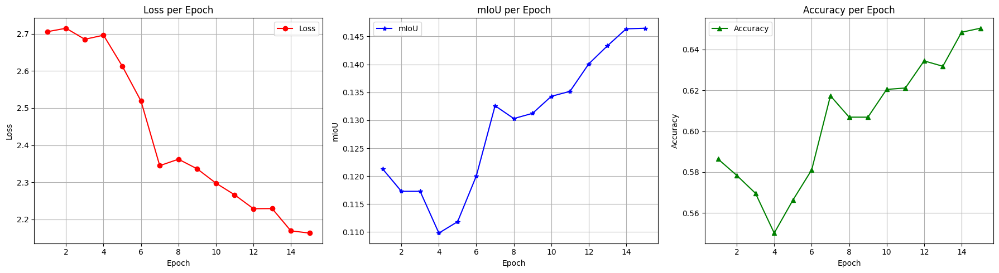

In [88]:
plot_metrics(history)

### Тестування

In [ ]:
image, mask = val_set[5]
pred_mask, score = predict_image_mask_miou(model, image, mask)

In [ ]:
fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(20,10))
ax1.imshow(image.permute(1, 2, 0).numpy())
ax1.set_title('Picture')

ax2.imshow(mask)
ax2.set_title('Ground truth')
ax2.set_axis_off()

ax3.imshow(pred_mask)
ax3.set_title('mIoU {:.3f}'.format(score))
ax3.set_axis_off()

In [53]:
ids_to_classes = {
    1: "person",
    2: "bicycle",
    3: "car",
    17: "dog",
}


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.980906..2.64].


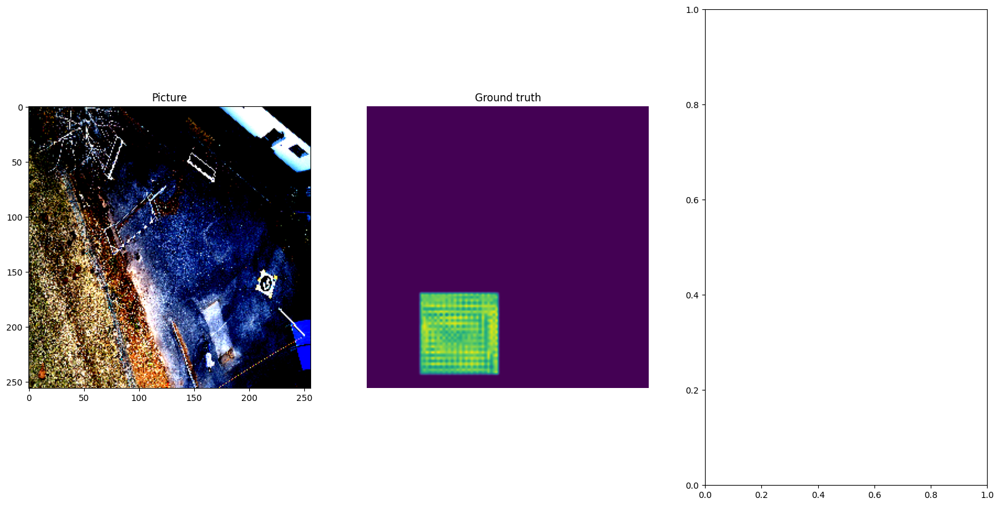

In [ ]:
# fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(20,10))
ax1.imshow(image.permute(1, 2, 0).numpy())
ax1.set_title('Picture')

ax2.imshow(outputs[0]["masks"][2].squeeze(0))
ax2.set_title('Ground truth')
ax2.set_axis_off()

# ax3.imshow(pred_mask)
# ax3.set_title('mIoU {:.3f}'.format(score))
# ax3.set_axis_off()

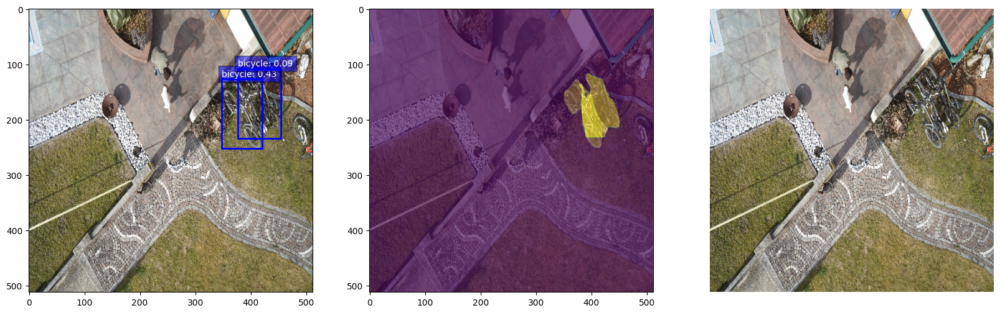

In [98]:
model.eval()
image, target = val_set[14]
with torch.no_grad():
    output = model(image.unsqueeze(0))
    visualize_prediction(image, output[0])


In [97]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torchvision.transforms.functional as F

def visualize_prediction(image, outputs, label_map=ids_to_classes, threshold=0.01):
    fig, (ax, ax2, ax3) = plt.subplots(1,3, figsize=(20,10))
    ax.imshow(image.permute(1, 2, 0).numpy())
    ax2.imshow(image.permute(1, 2, 0).numpy())


    for idx in range(len(outputs["boxes"])):
        score = outputs["scores"][idx].item()
        if score >= threshold and outputs["labels"][idx].item() in ids_to_classes.keys():  # Filter predictions by confidence threshold
            box = outputs["boxes"][idx].numpy()  # Get bounding box
            label = outputs["labels"][idx].item()  # Get label
            mask = outputs["masks"][idx][0].numpy() > 0.5  # Binary mask

            x_min, y_min, x_max, y_max = box
            rect = patches.Rectangle(
                (x_min, y_min),
                x_max - x_min,
                y_max - y_min,
                linewidth=2,
                edgecolor="blue",
                facecolor="none",
            )
            ax.add_patch(rect)
            
            label_name = label_map.get(label, str(label)) if label_map else str(label)
            ax.text(
                x_min,
                y_min - 5,
                f"{label_name}: {score:.2f}",
                color="white",
                fontsize=10,
                bbox=dict(facecolor="blue", alpha=0.5),
            )
            
            
            ax2.imshow(mask, alpha=0.4)

    ax3.imshow(image.permute(1, 2, 0).numpy())
    ax3.set_axis_off()
    


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.980906..2.64].


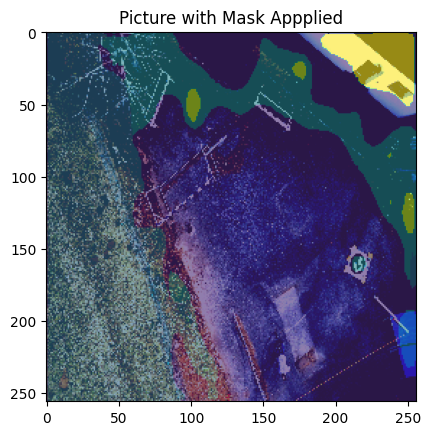

In [162]:
plt.imshow(image.permute(1, 2, 0).numpy())
plt.imshow(pred_mask, alpha=0.6)
plt.title('Picture with Mask Appplied')
plt.show()

##### Other & Experiments

In [ ]:
from torchvision.models.detection import maskrcnn_resnet50_fpn_v2
from torchvision.models import ResNet50_Weights

model = maskrcnn_resnet50_fpn_v2(weights="DEFAULT", weights_backbone=ResNet50_Weights.DEFAULT)

# num_classes = 5
# in_features = model.roi_heads.box_predictor.cls_score.in_features
# model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)

# in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
# hidden_layer = 256
# model.roi_heads.mask_predictor = torchvision.models.detection.mask_rcnn.MaskRCNNPredictor(
#     in_features_mask, hidden_layer, num_classes
# )